In [3]:
import glob
for path in glob.glob("**/data.mat", recursive=True):
    print(path)


exp/datasets/anes_data/simu/1/data.mat
exp/datasets/anes_data/simu/2/data.mat
exp/datasets/anes_data/simu/3/data.mat
exp/datasets/anes_data/simu/4/data.mat
exp/datasets/anes_data/vivo/data.mat


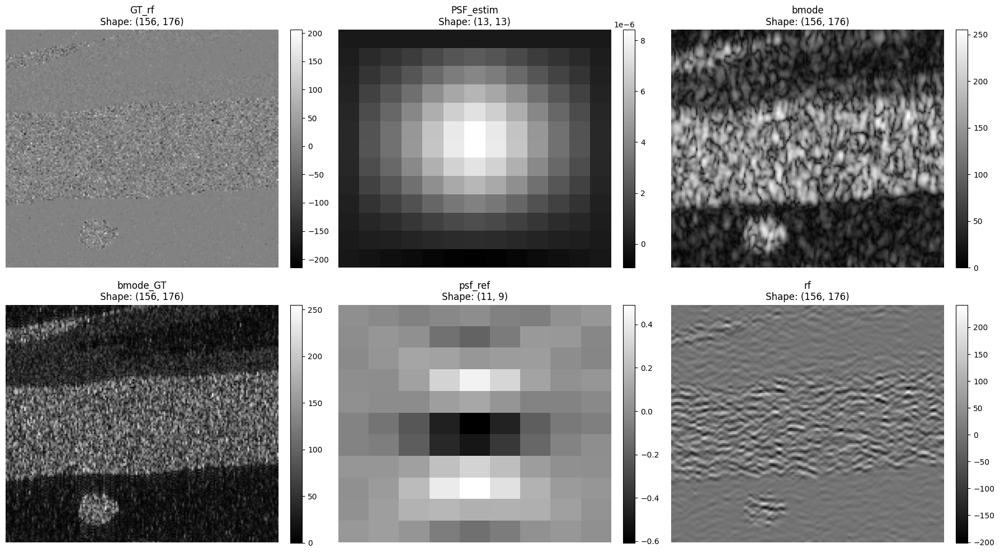

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# List of variable names to plot
variables_to_plot = ['GT_rf', 'PSF_estim', 'bmode', 'bmode_GT', 'psf_ref', 'rf']

# Create 2 rows × 3 columns subplot
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, var in enumerate(variables_to_plot):
    ax = axes[i]
    
    if var not in mat_data:
        ax.set_title(f"{var} (Not Found)")
        ax.axis('off')
        continue

    data = mat_data[var]
    
    # Slice third dimension if 3D
    if data.ndim == 3:
        img = data[:, :, 0]
    else:
        img = data

    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(f"{var}\nShape: {data.shape}")
    ax.axis('off')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


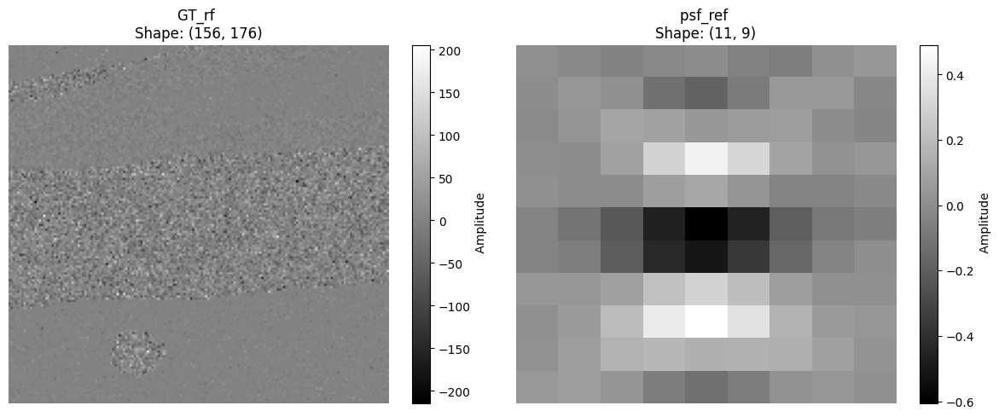

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Extract data
gt_rf = mat_data["GT_rf"]
psf_ref = mat_data["psf_ref"]



# Plot side-by-side
plt.figure(figsize=(12, 5))

# --- GT_rf ---
plt.subplot(1, 2, 1)
plt.imshow(gt_rf, cmap='gray', aspect='auto')
plt.title(f"GT_rf \nShape: {gt_rf.shape}")
plt.colorbar(label=' Amplitude')
plt.axis('off')

# --- psf_ref ---
plt.subplot(1, 2, 2)
plt.imshow(psf_ref, cmap='gray', aspect='auto')
plt.title(f"psf_ref \nShape: {psf_ref.shape}")
plt.colorbar(label=' Amplitude')
plt.axis('off')

plt.tight_layout()
plt.show()


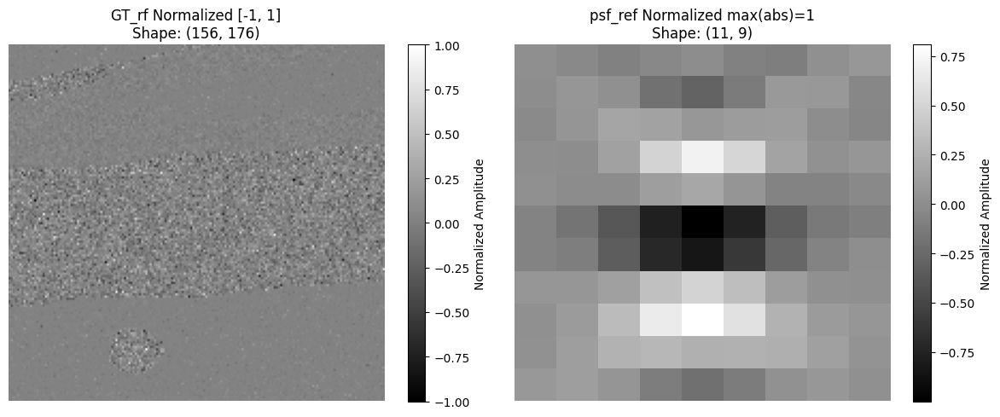

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Extract data
gt_rf = mat_data["GT_rf"]
psf_ref = mat_data["psf_ref"]

# Normalize GT_rf to [-1, 1]
gt_min, gt_max = gt_rf.min(), gt_rf.max()
gt_rf_norm = 2 * (gt_rf - gt_min) / (gt_max - gt_min + 1e-8) - 1  # Scale to [-1, 1]

# Normalize psf_ref so max(abs(.)) = 1
psf_ref_norm = psf_ref / (np.max(np.abs(psf_ref)) + 1e-8)

# Plot side-by-side
plt.figure(figsize=(12, 5))

# --- GT_rf (normalized to [-1, 1]) ---
plt.subplot(1, 2, 1)
plt.imshow(gt_rf_norm, cmap='gray', aspect='auto')
plt.title(f"GT_rf Normalized [-1, 1]\nShape: {gt_rf.shape}")
plt.colorbar(label='Normalized Amplitude')
plt.axis('off')

# --- psf_ref (normalized max(abs)=1) ---
plt.subplot(1, 2, 2)
plt.imshow(psf_ref_norm, cmap='gray', aspect='auto')
plt.title(f"psf_ref Normalized max(abs)=1\nShape: {psf_ref.shape}")
plt.colorbar(label='Normalized Amplitude')
plt.axis('off')

plt.tight_layout()
plt.show()


In [1]:
import os
import scipy.io

# Create output directory if it doesn't exist
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)

# Save normalized PSF
save_path = os.path.join(output_dir, "psf_ref_norm.mat")
scipy.io.savemat(save_path, {"psf_ref_norm": psf_ref_norm})

print(f"✅ Normalized PSF saved to: {save_path}")


NameError: name 'psf_ref_norm' is not defined

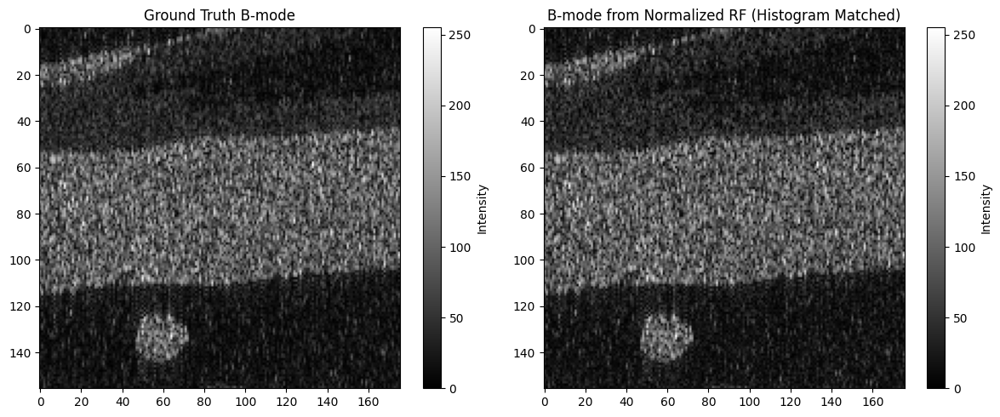

In [7]:
from skimage.exposure import match_histograms
from scipy.signal import hilbert

# Load GT B-mode for histogram reference
gt_bmode = mat_data["bmode_GT"]

# Redefine the rf_to_matched_bmode function
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Apply B-mode conversion with histogram matching
matched_bmode = rf_to_matched_bmode(gt_rf_norm, gt_bmode)

# Visualize matched B-mode and ground truth B-mode side-by-side
plt.figure(figsize=(12, 5))

# Ground truth B-mode
plt.subplot(1, 2, 1)
plt.imshow(gt_bmode, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.colorbar(label='Intensity')

# Histogram matched B-mode
plt.subplot(1, 2, 2)
plt.imshow(matched_bmode, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized RF (Histogram Matched)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


✅ Resized & normalized RF GT saved to: input/Simu/1/resized_rf_gt.mat


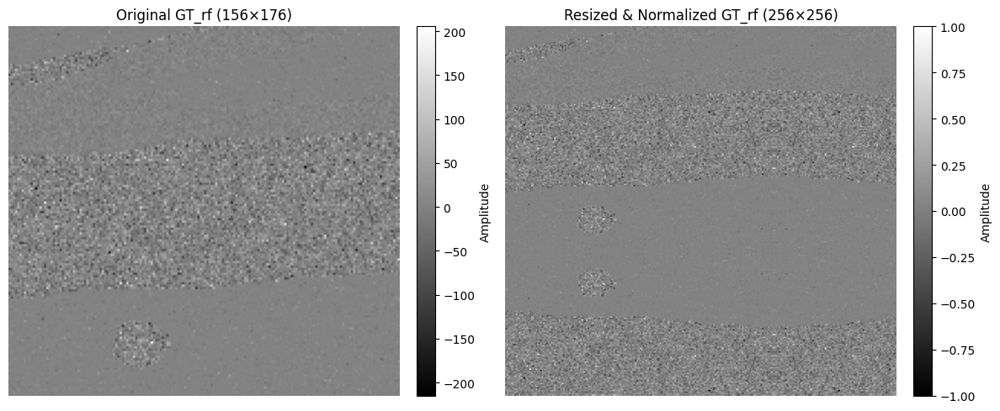

In [24]:
import numpy as np
import scipy.io
import os
import matplotlib.pyplot as plt

# Step 1: Load original RF data
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)
gt_rf = data['GT_rf']  # Shape: (156, 176)

# Step 2: Resize to 256x256 using mirroring
target_h, target_w = 256, 256
h, w = gt_rf.shape

gt_rf_resized = gt_rf.copy()
while gt_rf_resized.shape[1] < target_w:
    to_add = np.fliplr(gt_rf_resized)[:, :min(target_w - gt_rf_resized.shape[1], w)]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=1)

while gt_rf_resized.shape[0] < target_h:
    to_add = np.flipud(gt_rf_resized)[:min(target_h - gt_rf_resized.shape[0], h), :]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=0)

# Step 3: Normalize to [-1, 1]
min_val, max_val = gt_rf_resized.min(), gt_rf_resized.max()
gt_rf_resized = 2 * (gt_rf_resized - min_val) / (max_val - min_val + 1e-8) - 1

# Step 4: Save resized and normalized RF
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "resized_rf_gt.mat")
scipy.io.savemat(save_path, {"GT_rf_resized": gt_rf_resized})
print(f"✅ Resized & normalized RF GT saved to: {save_path}")

# Step 5: Visualization function
def show_rf_with_colorbar(data, title, ax):
    img = ax.imshow(data, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

# Step 6: Plot original and resized RF
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
show_rf_with_colorbar(gt_rf, f"Original GT_rf ({h}×{w})", axes[0])
show_rf_with_colorbar(gt_rf_resized, "Resized & Normalized GT_rf (256×256)", axes[1])

plt.tight_layout()
plt.show()


In [25]:
print(gt_rf_resized.shape)

(256, 256)


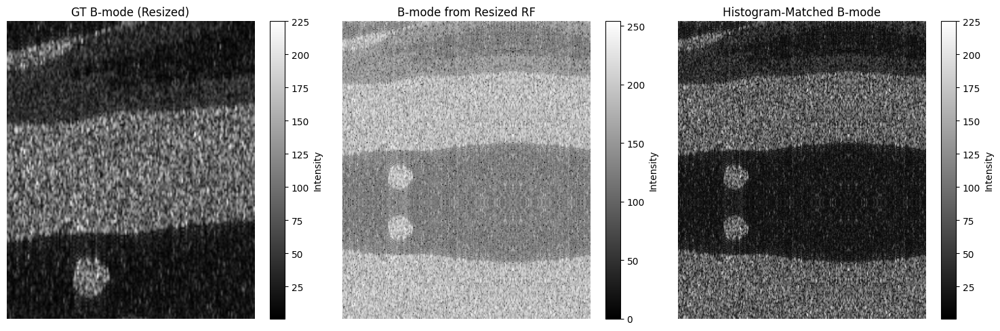

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.transform import resize

# === Load resized normalized RF ===
rf_data = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")
rf_resized = rf_data["GT_rf_resized"]

# === Load GT B-mode ===
mat_data = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
bmode_gt = mat_data["bmode_GT"]

# === Convert to B-mode (Hilbert + log compression) ===
def rf_to_bmode(RF, increase=1e-6):
    envelope = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(envelope + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    return db.astype(np.uint8)

# Convert resized RF to B-mode
bmode_resized = rf_to_bmode(rf_resized)

# Resize GT B-mode to 256×256 (if needed)
if bmode_gt.shape != (256, 256):
    bmode_gt_resized = resize(bmode_gt, (256, 256), preserve_range=True, anti_aliasing=True).astype(np.uint8)
else:
    bmode_gt_resized = bmode_gt.astype(np.uint8)

# === Histogram matching ===
bmode_matched = match_histograms(bmode_resized, bmode_gt_resized, channel_axis=None)
bmode_matched = np.clip(bmode_matched, 0, 255).astype(np.uint8)

# === Plot All B-modes ===
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(bmode_gt_resized, cmap='gray', aspect='auto')
plt.title("GT B-mode (Resized)")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("B-mode from Resized RF")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bmode_matched, cmap='gray', aspect='auto')
plt.title("Histogram-Matched B-mode")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.tight_layout()
plt.show()


✅ Saved degraded RF with BCCB + noise to input/Simu/1/degraded_y0.mat


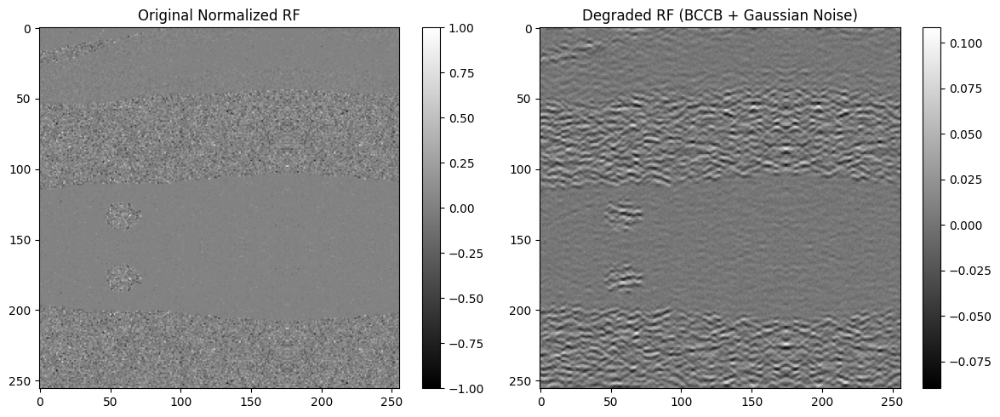

In [11]:
import numpy as np
import scipy.io
from numpy.fft import fft2, ifft2, fftshift
import matplotlib.pyplot as plt

# === Load normalized resized RF and PSF ===
rf_data = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")  # (256, 256)
gt_rf = rf_data["GT_rf_resized"]

psf_data = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
psf = psf_data["psf_ref"]
psf = psf / (np.sum(np.abs(psf)) + 1e-8)  # Normalize PSF

# === Pad and center PSF to match RF size ===
H, W = gt_rf.shape
psf_padded = np.zeros((H, W), dtype=np.float32)
ph, pw = psf.shape
psf_padded[:ph, :pw] = psf

# Center the PSF in the frequency domain
psf_padded = np.roll(np.roll(psf_padded, -ph // 2, axis=0), -pw // 2, axis=1)

# === FFT of the PSF (for BCCB convolution) ===
H_fft = fft2(psf_padded)

# === Degrade the RF using BCCB convolution ===
Y_fft = H_fft * fft2(gt_rf)
y = np.real(ifft2(Y_fft))

# === Add Gaussian noise ===
noise_std = 0.003508  # Set SNR here
noise = np.random.normal(0, noise_std, size=y.shape).astype(np.float32)
y_noisy = y + noise

# === Save degraded RF ===
scipy.io.savemat("input/Simu/1/degraded_y0.mat", {"rf_degraded": y_noisy})
print("✅ Saved degraded RF with BCCB + noise to input/Simu/1/degraded_y0.mat")

# === Visualize original vs degraded ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gt_rf, cmap='gray', aspect='auto')
plt.title("Original Normalized RF")
plt.colorbar()

plt.subplot(1, 2, 2)
y_noisy = np.clip(y_noisy, -1.0, 1.0)
plt.imshow(y_noisy, cmap='gray', aspect='auto')
plt.title("Degraded RF (BCCB + Gaussian Noise)")
plt.colorbar()

plt.tight_layout()
plt.show()


In [12]:
snr = 10 * np.log10(np.sum(gt_rf**2) / np.sum(noise**2))
print(f"SNR: {snr:.2f} dB")


SNR: 30.00 dB


In [36]:
!python degradation.py \
  --gt_mat input/Simu/1/ground_truth.mat \
  --psf_mat exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --output_mat input/Simu/1/degraded_y0.mat \
  --target_snr_db 30



✅ Ground truth RF shape: (256, 256)
✅ PSF shape: (11, 9)
✅ Computed noise std from target SNR 30.0 dB: σ = 0.003508
✅ Actual SNR achieved: 29.99 dB
✅ Saved degraded RF with BCCB + noise to input/Simu/1/degraded_y0.mat


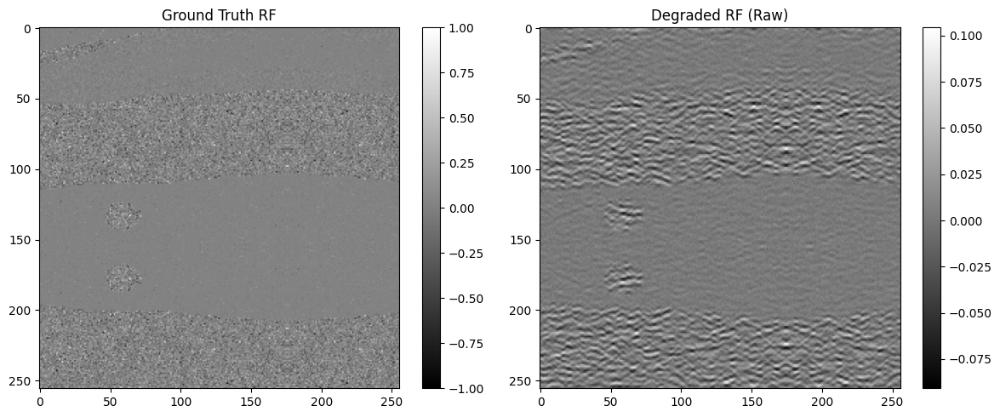

In [37]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

gt_rf = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
deg_rf = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gt_rf, cmap='gray', aspect='auto')
plt.title("Ground Truth RF")
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(deg_rf, cmap='gray', aspect='auto')
plt.title("Degraded RF (Raw)")
plt.colorbar()

plt.tight_layout()
plt.show()


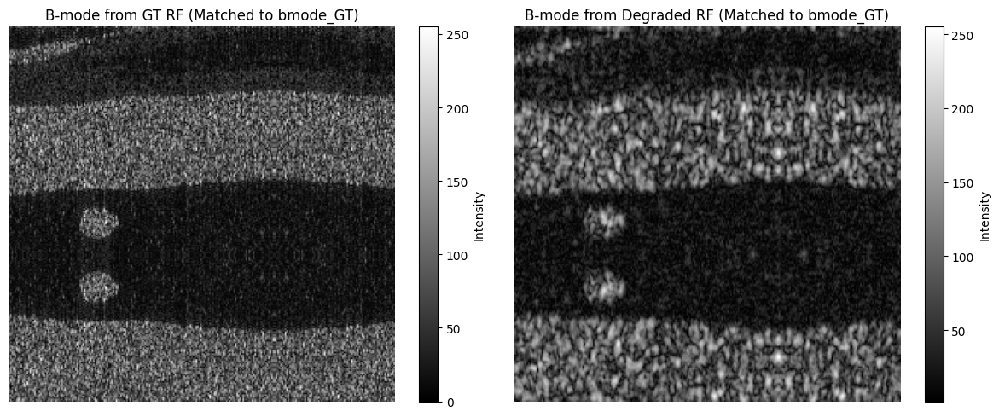

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from skimage.exposure import match_histograms
from scipy.signal import hilbert

# === Load .mat files ===
gt_mat = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")
degraded_mat = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")
ref_mat = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")  # contains bmode_GT

# Extract arrays
gt_rf = gt_mat["GT_rf_resized"]
rf_degraded = degraded_mat["rf_degraded"]
gt_bmode = ref_mat["bmode_GT"]

# === Custom B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Apply conversion ===
bmode_gt_converted = rf_to_matched_bmode(gt_rf, gt_bmode)
bmode_deg_converted = rf_to_matched_bmode(rf_degraded, gt_bmode)

# === Plot comparison ===
plt.figure(figsize=(12, 5))

# GT B-mode
plt.subplot(1, 2, 1)
plt.imshow(bmode_gt_converted, cmap='gray', aspect='auto')
plt.title("B-mode from GT RF (Matched to bmode_GT)")
plt.colorbar(label="Intensity")
plt.axis('off')

# Degraded B-mode
plt.subplot(1, 2, 2)
plt.imshow(bmode_deg_converted, cmap='gray', aspect='auto')
plt.title("B-mode from Degraded RF (Matched to bmode_GT)")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.tight_layout()
plt.show()


✅ Restored RF saved to input/Simu/1/restored_rf_wiener.mat


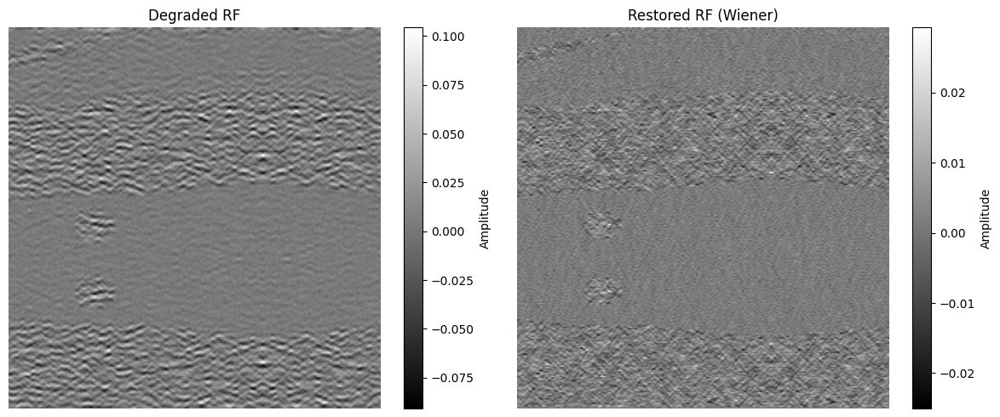

In [54]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# === Load degraded RF and PSF ===
degraded_mat = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")
rf_degraded = degraded_mat["rf_degraded"]

psf_mat = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
psf = psf_mat["psf_ref"]

# === Normalize PSF: max(abs) = 1 ===
psf_norm = psf / (np.max(np.abs(psf)) + 1e-8)

# === Wiener Deconvolution Function ===
def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # FFTs
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filter
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# === Apply Wiener Deconvolution ===
restored_rf = wiener_deconvolution(rf_degraded, psf_norm, K=0.3)
rf_restored_norm = 2 * (restored_rf - restored_rf.min()) / (restored_rf.max() - restored_rf.min() + 1e-8) - 1

# === Save restored RF ===
scipy.io.savemat("input/Simu/1/restored_rf_wiener.mat", {"rf_restored": restored_rf})
print("✅ Restored RF saved to input/Simu/1/restored_rf_wiener.mat")

# === Visualize Original vs Restored RF ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(rf_degraded, cmap='gray', aspect='auto')
plt.title("Degraded RF")
plt.colorbar(label='Amplitude')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(restored_rf, cmap='gray', aspect='auto')
plt.title("Restored RF (Wiener)")
plt.colorbar(label='Amplitude')
plt.axis('off')

plt.tight_layout()
plt.show()


In [55]:
import scipy.io
rf_restored = scipy.io.loadmat("input/Simu/1/restored_rf_wiener.mat")["rf_restored"]

print("Range of restored RF:")
print(f"min = {rf_restored.min():.4f}, max = {rf_restored.max():.4f}")


Range of restored RF:
min = -0.0250, max = 0.0293


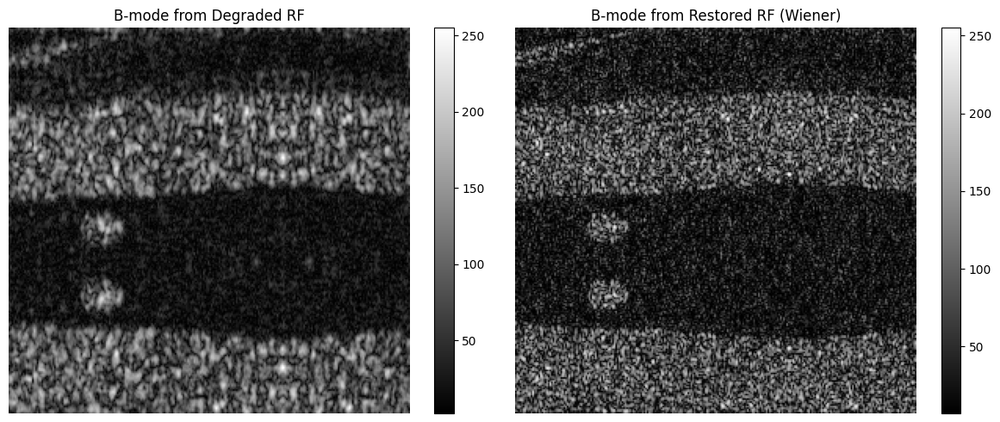

In [56]:
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# Load reference B-mode (for histogram matching)
gt_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Apply to all
bmode_restored = rf_to_matched_bmode(restored_rf, gt_bmode)
bmode_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)

# Visualize
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto')
plt.title("B-mode from Degraded RF")
plt.axis('off')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.imshow(bmode_restored, cmap='gray', aspect='auto')
plt.title("B-mode from Restored RF (Wiener)")
plt.axis('off')
plt.colorbar()

plt.tight_layout()
plt.show()


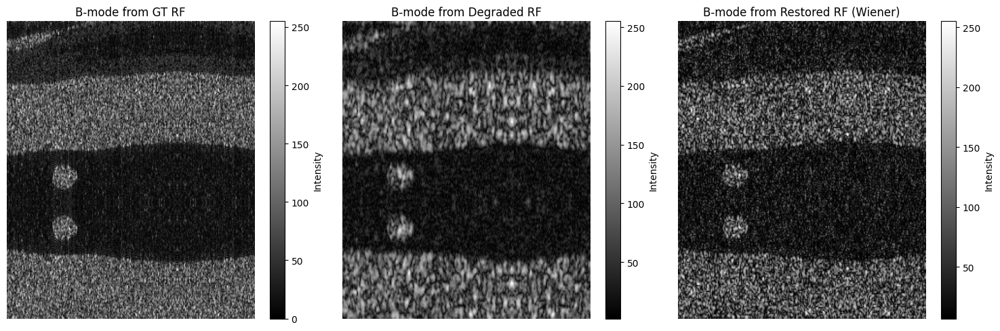

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# === Load RF signals ===
gt_rf = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/restored_rf_wiener.mat")["rf_restored"]

# === Load GT B-mode for histogram matching reference ===
gt_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === Custom B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Apply B-mode conversion ===
bmode_gt        = rf_to_matched_bmode(gt_rf,        gt_bmode)
bmode_degraded  = rf_to_matched_bmode(rf_degraded,  gt_bmode)
bmode_restored  = rf_to_matched_bmode(rf_restored,  gt_bmode)

# === Plot all side by side ===
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("B-mode from GT RF")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto')
plt.title("B-mode from Degraded RF")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored, cmap='gray', aspect='auto')
plt.title("B-mode from Restored RF (Wiener)")
plt.colorbar(label="Intensity")
plt.axis('off')

plt.tight_layout()
plt.show()


In [23]:
!ls -lh input/Simu/1


total 2.6M
drwxr-sr-x. 2 pdas occ-minds    0 May 21 12:16 ddrm_out
-rw-r--r--. 1 pdas occ-minds 513K May 23 17:17 degraded_y0.mat
-rw-r--r--. 1 pdas occ-minds 513K May 21 11:45 ground_truth.mat
-rw-r--r--. 1 pdas occ-minds  992 May 23 16:45 psf_ref_norm.mat
-rw-r--r--. 1 pdas occ-minds 513K May 23 17:17 resized_rf_gt.mat
-rw-r--r--. 1 pdas occ-minds 513K May 21 14:35 restored_ddrm.mat
-rw-r--r--. 1 pdas occ-minds 513K May 23 17:20 restored_rf_wiener.mat


In [64]:
!python run_ddrm_restoration.py \
  --degraded_mat input/Simu/1/degraded_y0.mat \
  --gt_mat       input/Simu/1/resized_rf_gt.mat \
  --psf_path     exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --model_path   exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --config       deblur_us.yml \
  --timesteps    100 \
  --eta          0.95 \
  --etaB         1.0 \
  --sigma_0      0.01 \
  --output_dir   input/Simu/1/ddrm_out


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
✅ PSF loaded (key='psf_ref', shape=(11, 9))
INFO - main.py - 2025-05-23 17:50:07,547 - Using device: cuda
✅ Model checkpoint loaded
100it [00:47,  2.11it/s]
✅ Saved input/Simu/1/ddrm_out/restored_ddrm.mat (normalized to [-1, 1])
PSNR: 14.78 dB   SSIM: -0.0180


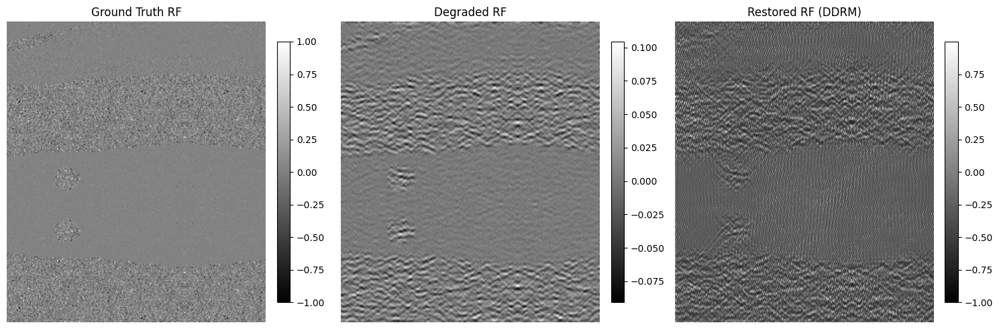

RF Ranges:
  GT       : min = -1.0000, max = 1.0000
  Degraded : min = -0.0908, max = 0.1044
  Restored : min = -1.0000, max = 1.0000


In [65]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# === Load all RF signals ===
rf_gt       = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/ddrm_out/restored_ddrm.mat")["rf_restored"]

# === Plot side by side ===
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
titles = ["Ground Truth RF", "Degraded RF", "Restored RF (DDRM)"]
data = [rf_gt, rf_degraded, rf_restored]

for ax, img, title in zip(axes, data, titles):
    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# Optionally print ranges
print("RF Ranges:")
print(f"  GT       : min = {rf_gt.min():.4f}, max = {rf_gt.max():.4f}")
print(f"  Degraded : min = {rf_degraded.min():.4f}, max = {rf_degraded.max():.4f}")
print(f"  Restored : min = {rf_restored.min():.4f}, max = {rf_restored.max():.4f}")


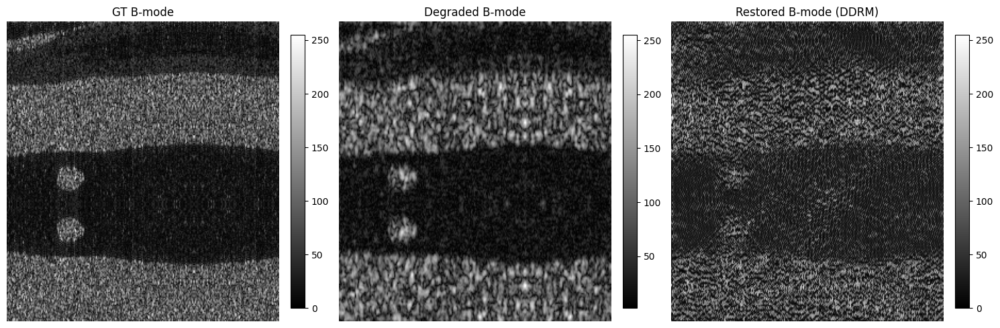

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# === Load RF signals ===
rf_gt       = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/ddrm_out/restored_ddrm.mat")["rf_restored"]

# === Load GT B-mode reference ===
gt_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert all RFs to B-mode ===
bmode_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
bmode_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
bmode_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Plot side-by-side ===
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
titles = ["GT B-mode", "Degraded B-mode", "Restored B-mode (DDRM)"]
images = [bmode_gt, bmode_degraded, bmode_restored]

for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


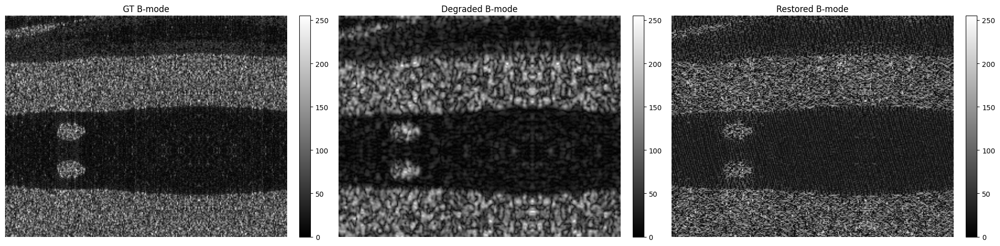

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import hilbert
from skimage.exposure import match_histograms


# === Load RF signals ===
rf_gt       = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/ddrm_out/restored_ddrm.mat")["rf_restored"]

# === Normalize RF restored to [-1, 1] before conversion ===
min_r, max_r = rf_restored.min(), rf_restored.max()
rf_restored_norm = 2 * (rf_restored - min_r) / (max_r - min_r + 1e-8) - 1

# === Load GT B-mode reference ===
gt_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)


# === Convert all RFs to B-mode ===
bmode_gt       = rf_to_matched_bmode(rf_gt,       gt_bmode)
bmode_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
bmode_restored = rf_to_matched_bmode(rf_restored_norm, gt_bmode)

# === Apply sharpening to restored B-mode only ===
bmode_restored_sharp = sharpen(bmode_restored, sigma=1.0, alpha=1.5)

# === Plot side-by-side ===
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
titles = ["GT B-mode", "Degraded B-mode", "Restored B-mode"]
images = [bmode_gt, bmode_degraded, bmode_restored]

for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


GT RF shape      : (256, 256)
Degraded RF shape: (256, 256)


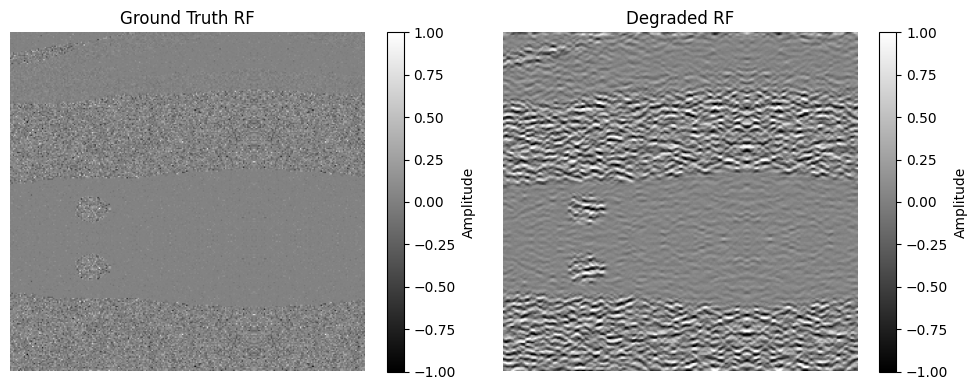

In [29]:
import scipy.io
import matplotlib.pyplot as plt

# 1) Load
gt = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]

# 2) Check sizes
print(f"GT RF shape      : {gt.shape}")
print(f"Degraded RF shape: {deg.shape}")

# 3) Visualize raw RF
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(gt, cmap="gray", aspect="auto")
plt.title("Ground Truth RF")
plt.colorbar(label="Amplitude")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(deg, cmap="gray", aspect="auto")
plt.title("Degraded RF")
plt.colorbar(label="Amplitude")
plt.axis("off")

plt.tight_layout()
plt.show()


In [67]:
!python degradation.py \
  --gt_mat input/Simu/1/resized_rf_gt.mat \
  --psf_mat exp/datasets/anes_data/simu/1/data.mat \
  --output_mat input/Simu/1/degraded_y0.mat \
  --noise_std 0.01


✅ Ground truth RF shape: (256, 256)
✅ PSF shape: (11, 9)
✅ Using fixed noise std: σ = 0.010000
📊 Actual SNR achieved: 4.42 dB
✅ Saved degraded RF to input/Simu/1/degraded_y0.mat


GT RF shape      : (256, 256)
Degraded RF shape: (256, 256)


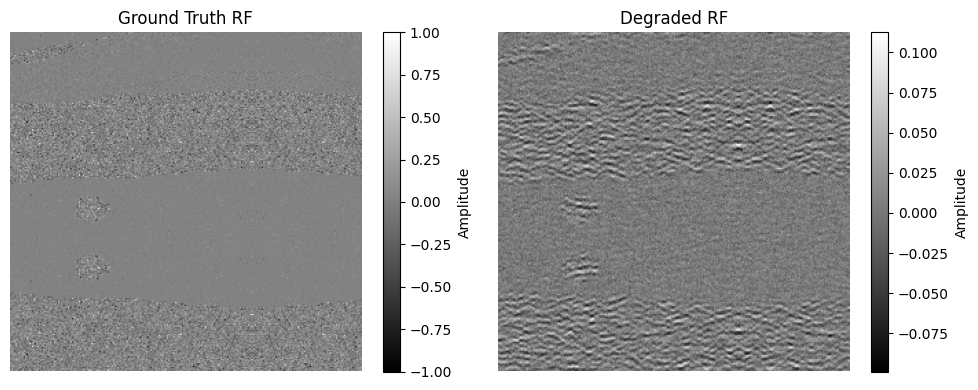

In [73]:
import scipy.io
import matplotlib.pyplot as plt

# 1) Load
gt = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
deg = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]

# 2) Check sizes
print(f"GT RF shape      : {gt.shape}")
print(f"Degraded RF shape: {deg.shape}")

# 3) Visualize raw RF
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(gt, cmap="gray", aspect="auto")
plt.title("Ground Truth RF")
plt.colorbar(label="Amplitude")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(deg, cmap="gray", aspect="auto")
plt.title("Degraded RF")
plt.colorbar(label="Amplitude")
plt.axis("off")

plt.tight_layout()
plt.show()


In [74]:
!python ddrm_old.py \
  --degraded_mat input/Simu/1/degraded_y0.mat \
  --gt_mat       input/Simu/1/resized_rf_gt.mat \
  --psf_path     exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --model_path   exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --config       deblur_us.yml \
  --timesteps    100 \
  --eta          0.85 \
  --etaB         1.0 \
  --sigma_0      0.01 \
  --output_dir   input/Simu/1


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
✅ PSF loaded (key='psf_ref', shape=(11, 9))
INFO - main.py - 2025-05-23 18:05:53,161 - Using device: cuda
✅ Model checkpoint loaded
100it [00:47,  2.10it/s]
✅ Saved input/Simu/1/restored_ddrm.mat (restored RF in [-1, 1])
PSNR: 25.14 dB   SSIM: 0.2684


In [69]:
restored_rf = scipy.io.loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]
print(f"Restored RF range: min = {restored_rf.min():.4f}, max = {restored_rf.max():.4f}")


Restored RF range: min = -0.0741, max = 0.0849


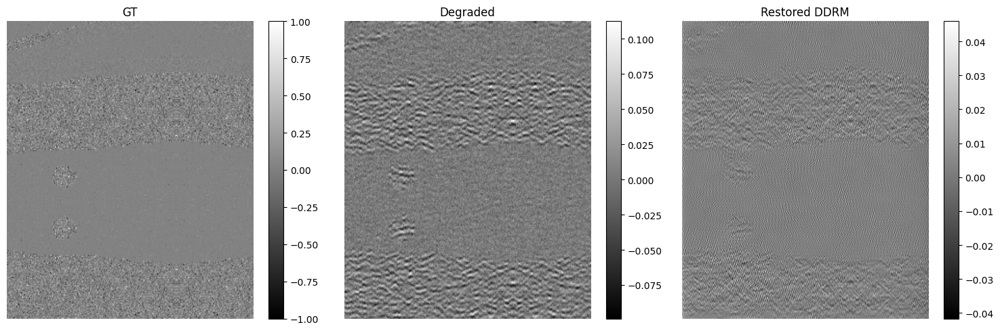

In [75]:
from scipy.io import loadmat
import matplotlib.pyplot as plt

gt  = loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
deg = loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
res = loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]

plt.figure(figsize=(15, 5))
for i, (img, title) in enumerate(zip([gt, deg, res], ["GT", "Degraded", "Restored DDRM"])):
    plt.subplot(1, 3, i+1)
    plt.imshow(img, cmap="gray", aspect="auto")
    plt.title(title)
    plt.axis("off")
    plt.colorbar()
plt.tight_layout()
plt.show()


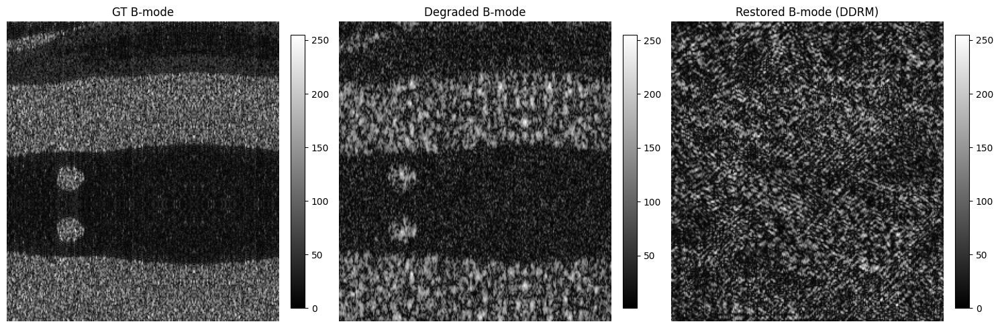

In [77]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# === Load RF signals ===
rf_gt       = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]

# === Load GT B-mode reference ===
gt_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

import numpy as np

def normalize_rf(rf: np.ndarray, target_min: float = -1.0, target_max: float = 1.0) -> np.ndarray:
    """
    Normalize RF signal to a specific range [target_min, target_max].
    """
    rf_min, rf_max = np.min(rf), np.max(rf)
    norm_rf = (rf - rf_min) / (rf_max - rf_min + 1e-8)  # scale to [0, 1]
    norm_rf = norm_rf * (target_max - target_min) + target_min  # scale to [target_min, target_max]
    return norm_rf


# Normalize to [-1, 1]
restored_rf_normalized = normalize_rf(restored_rf, target_min=-1.0, target_max=1.0)



# === B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert all RFs to B-mode ===
bmode_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
bmode_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
bmode_restored = rf_to_matched_bmode(restored_rf_normalized, gt_bmode)


# === Plot side-by-side ===
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
titles = ["GT B-mode", "Degraded B-mode", "Restored B-mode (DDRM)"]
images = [bmode_gt, bmode_degraded, bmode_restored]

for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


In [78]:
from skimage.metrics import peak_signal_noise_ratio

psnr = peak_signal_noise_ratio(rf_gt, restored_rf_normalized)
titles[2] += f" | PSNR: {psnr:.2f} dB"


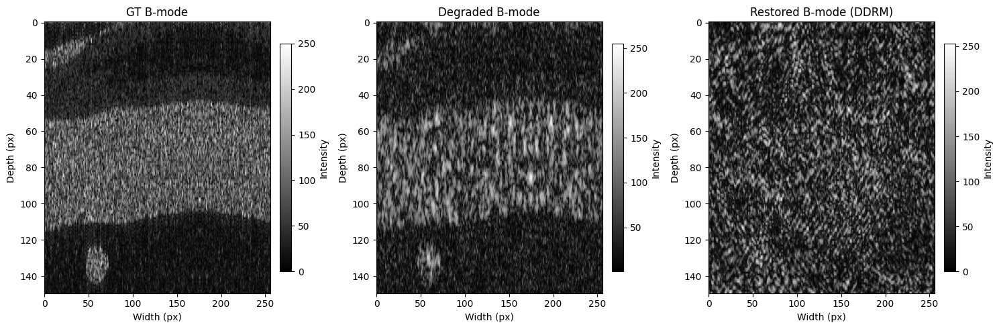

In [72]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# === Load RF signals ===
rf_gt       = scipy.io.loadmat("input/Simu/1/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/restored_ddrm.mat")["rf_restored"]

# === Load GT B-mode reference ===
gt_bmode = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert all RFs to B-mode ===
bmode_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
bmode_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
bmode_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Crop to show top portion only (e.g., top circular phantom) ===
crop_start = 0
crop_end = 150
bmode_gt_cropped       = bmode_gt[crop_start:crop_end, :]
bmode_degraded_cropped = bmode_degraded[crop_start:crop_end, :]
bmode_restored_cropped = bmode_restored[crop_start:crop_end, :]

# === Plot all three side by side ===
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
titles = ["GT B-mode", "Degraded B-mode", "Restored B-mode (DDRM)"]
images = [bmode_gt_cropped, bmode_degraded_cropped, bmode_restored_cropped]

for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.set_xlabel("Width (px)")
    ax.set_ylabel("Depth (px)")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Intensity")

plt.tight_layout()
plt.show()
